# Analyze loss function in summary_optuna

**Motivation:** Having file summary_optuna with all optuna reuslts, this file aims to analyze all these results (in terms of loss function)

### loads

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import re

# local
import set_path
import supp.support_load as ls
from supp.support_save import save_df
from supp.support_model_glm import get_model_coef_df, get_model_coef_dict

In [33]:
summary_optuna_v1 = ls.read_excel('summary_optuna_v1_mod')['optuna_results']
summary_optuna_v2 = ls.read_excel('summary_optuna_v2_mod')['optuna_results']

# drop models that reached max epoch
max_epoch = 1000
summary_optuna_v1 = summary_optuna_v1[summary_optuna_v1['epoch']!=max_epoch]
summary_optuna_v2 = summary_optuna_v2[summary_optuna_v2['epoch']!=max_epoch]

print(f'{summary_optuna_v1.shape}\t shape of summary_optuna_v1')
print(f'{summary_optuna_v2.shape}\t shape of summary_optuna_v2')

Excel file loaded.
C:\Users\Stoja\OneDrive\Documents\diplomka\scr\data\summary_optuna_v1_mod.xlsx
Excel file loaded.
C:\Users\Stoja\OneDrive\Documents\diplomka\scr\data\summary_optuna_v2_mod.xlsx
(1741, 24)	 shape of summary_optuna_v1
(1848, 24)	 shape of summary_optuna_v2


In [34]:
# Add loss type
def add_loss_type(df):
    df['loss_type'] = 'BCE_specific'
    for mod in ['step', 'lasso', 'ridge']:
        mask1 = df['type'] == f'{mod}_small_mse'
        mask2 = df['type'] == f'{mod}_weight'
        mask3 = df['type'] == f'{mod}'
        
        df.loc[mask1, 'loss_type'] = 'MSE' 
        df.loc[mask2, 'loss_type'] = 'BCE_with_weights' 
        df.loc[mask3, 'loss_type'] = 'BCE'

    return df

summary_optuna_v1 = add_loss_type(summary_optuna_v1)
summary_optuna_v2 = add_loss_type(summary_optuna_v2)

In [35]:
# map n_layers to categorical (string)
summary_optuna_v1['n_layers'] = summary_optuna_v1['n_layers'].astype(str)
summary_optuna_v2['n_layers'] = summary_optuna_v2['n_layers'].astype(str)

In [36]:
# Add loss type
def add_loss_type(df):
    df['loss_type'] = 'BCE_specific'
    for mod in ['step', 'lasso', 'ridge']:
        mask1 = df['type'] == f'{mod}_small_mse'
        mask2 = df['type'] == f'{mod}_weight'
        mask3 = df['type'] == f'{mod}'
        
        df.loc[mask1, 'loss_type'] = 'MSE' 
        df.loc[mask2, 'loss_type'] = 'BCE_with_weights' 
        df.loc[mask3, 'loss_type'] = 'BCE'

    return df

summary_optuna_v1 = add_loss_type(summary_optuna_v1)
summary_optuna_v2 = add_loss_type(summary_optuna_v2)

#### overview v1

In [37]:
summary_optuna_v1.head(2)

,model name,model modification,model param,type,trial,time_id,n_layers,layer_1,layer_2,layer_3,...,mean,mean_vizier,mean_non_vizier,bottom_3th_vizier,top_3th_non_vizier,viziers_above_overlap,viziers_in_overlap,non_viziers_in_overlap,persons_in_overlap,loss_type
0,step,small,mse,step_small_mse,42,2025032112554070,3,10,42.0,42.0,...,0.022370,0.659759,0.009006,0.396573,0.401127,8.0,5.4,10.0,15.4,MSE
1,step,small,mse,step_small_mse,39,2025032112531800,3,10,42.0,42.0,...,0.023099,0.649999,0.009950,0.383015,0.398460,8.6,4.8,10.2,15.0,MSE


In [38]:
summary_optuna_v1['type'].value_counts()

type
ridge_weight       93
step_small_mse     91
ridge_small_mse    89
lasso_small_mse    86
step_weight        80
lasso_weight       76
lasso_l2_03        52
ridge_l2_03        48
step               48
step_l2_02         47
lasso_l2_02        47
ridge              47
ridge_do_01        47
step_do_01         47
lasso              47
step_l2_04         47
step_l2_06         47
step_l2_05         46
lasso_l2_04        46
lasso_do_03        46
step_do_03         46
ridge_l2_02        46
lasso_l2_06        45
step_do_05         45
ridge_do_05        45
ridge_l2_06        44
lasso_do_05        44
step_l2_03         44
ridge_do_03        44
lasso_do_01        42
lasso_l2_05        41
ridge_l2_04        41
ridge_l2_05        37
Name: count, dtype: int64

#### overview v2

In [39]:
summary_optuna_v2.head(2)

,model name,model modification,model param,type,trial,time_id,n_layers,layer_1,layer_2,layer_3,...,mean,mean_vizier,mean_non_vizier,bottom_3th_vizier,top_3th_non_vizier,viziers_above_overlap,viziers_in_overlap,non_viziers_in_overlap,persons_in_overlap,loss_type
0,lasso,l2,05,lasso_l2_05,10,2025032204280980,3,10,2.0,2.0,...,0.020179,0.372778,0.012851,0.182646,0.183394,9.4,4.0,15.0,19.0,BCE_specific
1,ridge,do,05,ridge_do_05,27,2025032206251390,3,42,34.0,2.0,...,0.016758,0.229650,0.012355,0.162181,0.201064,11.6,1.8,19.6,21.4,BCE_specific


In [40]:
summary_optuna_v2['type'].value_counts()

type
ridge_weight       100
step_weight        100
lasso_weight        99
step_small_mse      95
ridge_small_mse     92
lasso_small_mse     84
ridge               77
lasso_do_01         54
step_do_01          49
lasso_l2_03         49
step_do_05          48
lasso_l2_04         48
lasso_l2_02         48
step_l2_05          48
step_l2_04          47
ridge_l2_03         47
step_do_03          47
step_l2_03          47
lasso_l2_06         47
step                47
step_l2_02          47
ridge_l2_02         46
ridge_l2_06         46
ridge_l2_04         46
lasso_l2_05         46
ridge_l2_05         46
lasso_do_05         45
step_l2_06          44
ridge_do_01         44
ridge_do_03         44
lasso_do_03         42
ridge_do_05         40
lasso               39
Name: count, dtype: int64

### Analysis

In [41]:
df_original = summary_optuna_v2.copy()
df_original.columns

Index(['model name', 'model modification', 'model param', 'type', 'trial',
       'time_id', 'n_layers', 'layer_1', 'layer_2', 'layer_3', 'activation',
       'optimizer', 'learning_rate', 'loss', 'epoch', 'mean', 'mean_vizier',
       'mean_non_vizier', 'bottom_3th_vizier', 'top_3th_non_vizier',
       'viziers_above_overlap', 'viziers_in_overlap', 'non_viziers_in_overlap',
       'persons_in_overlap', 'loss_type'],
      dtype='object')

#### loss type

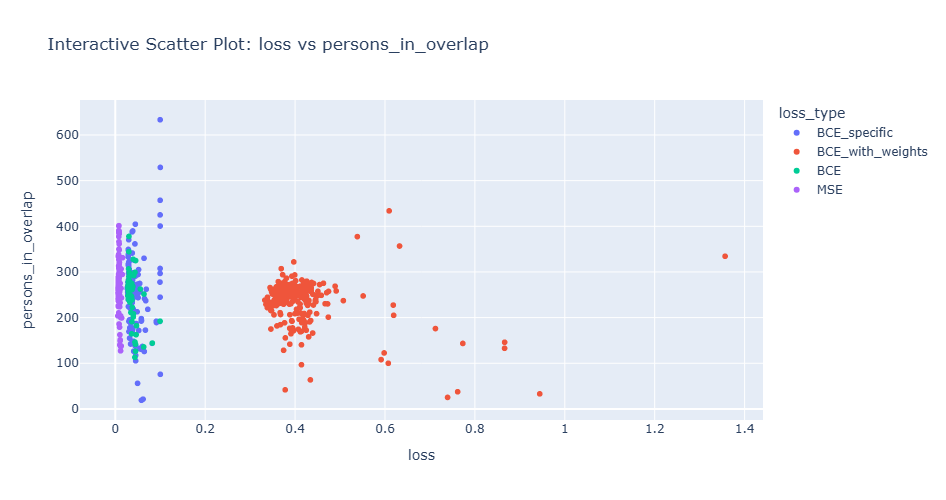

In [61]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='loss_type',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

##### loss type others

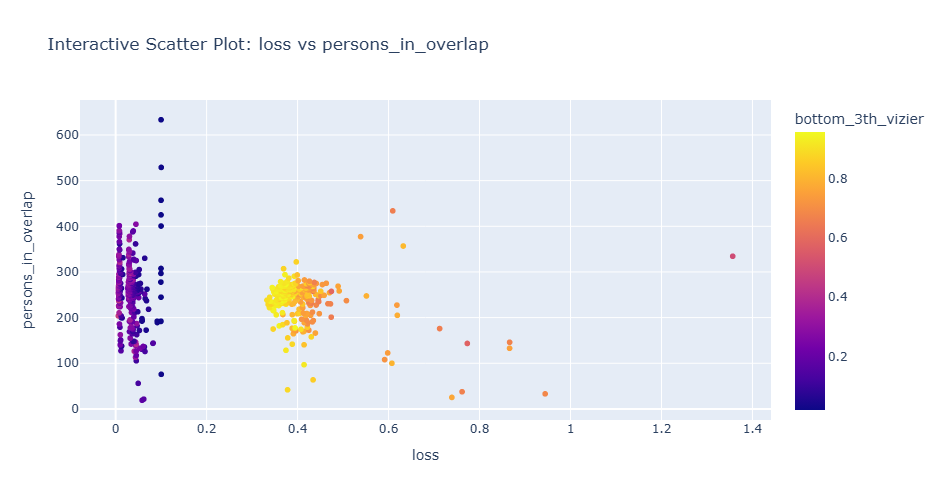

In [68]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='bottom_3th_vizier',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

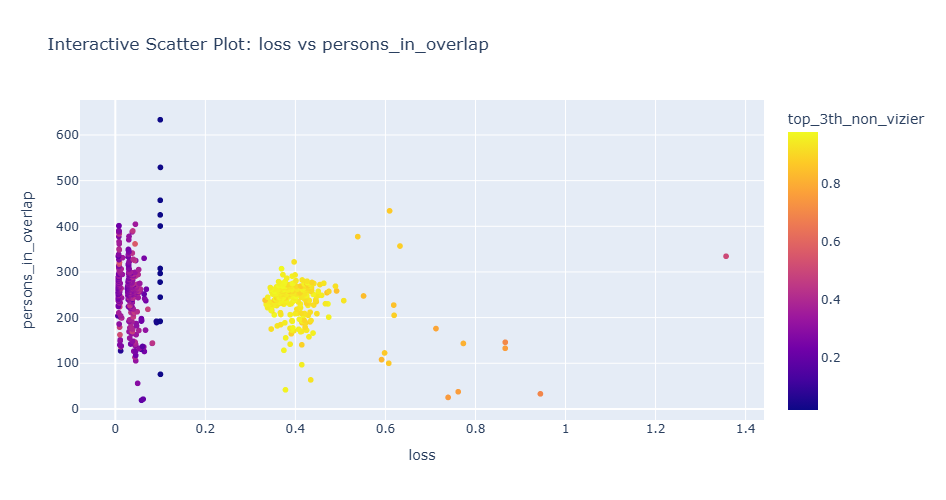

In [69]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='top_3th_non_vizier',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

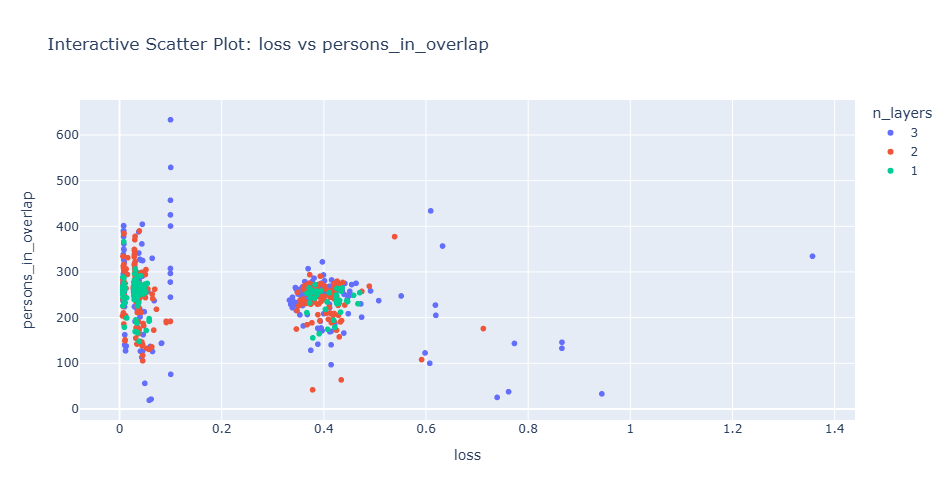

In [70]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='n_layers',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

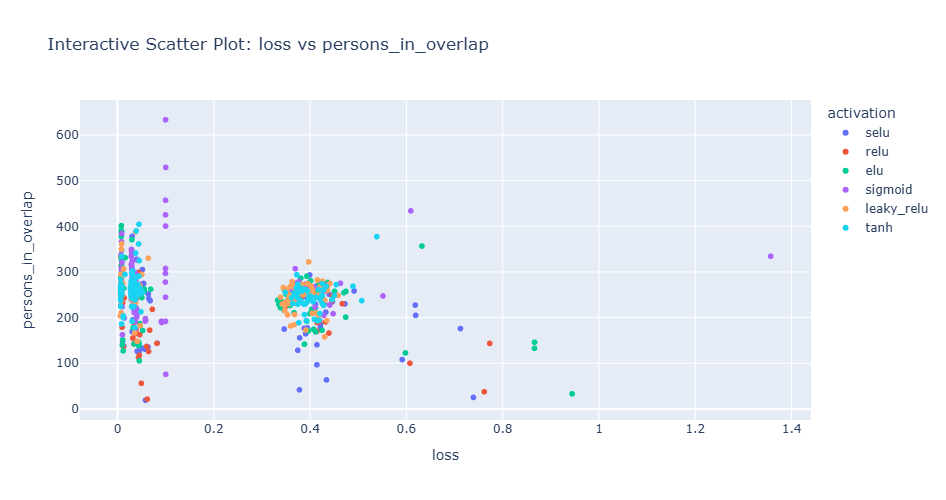

In [71]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='activation',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

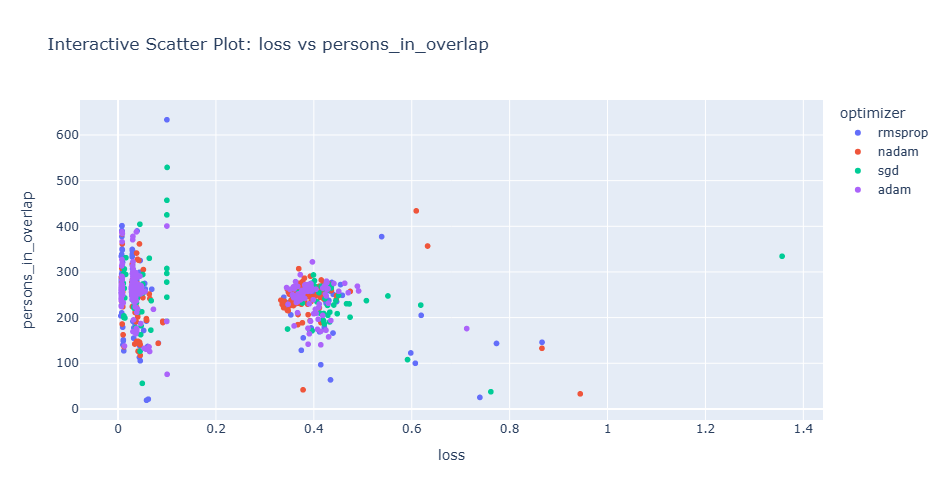

In [72]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='optimizer',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

#### non mse, weight loss

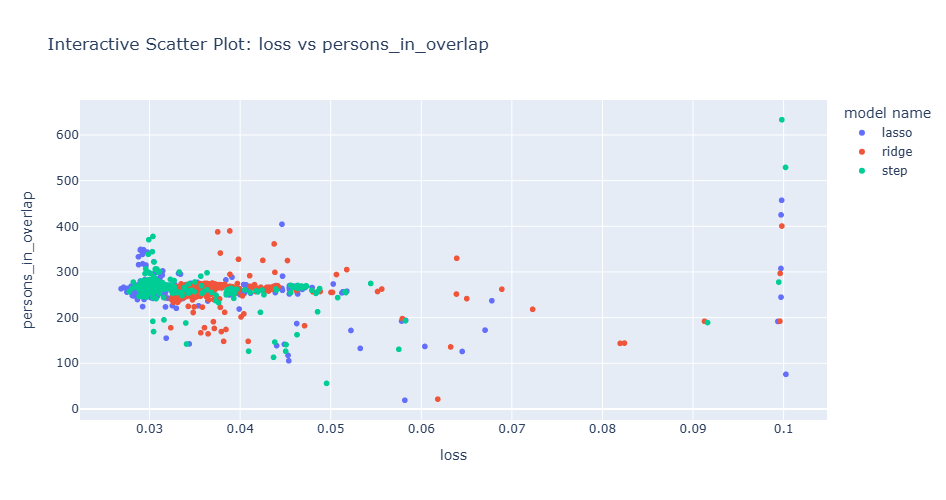

In [73]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='model name',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

##### non mse, weight loss other

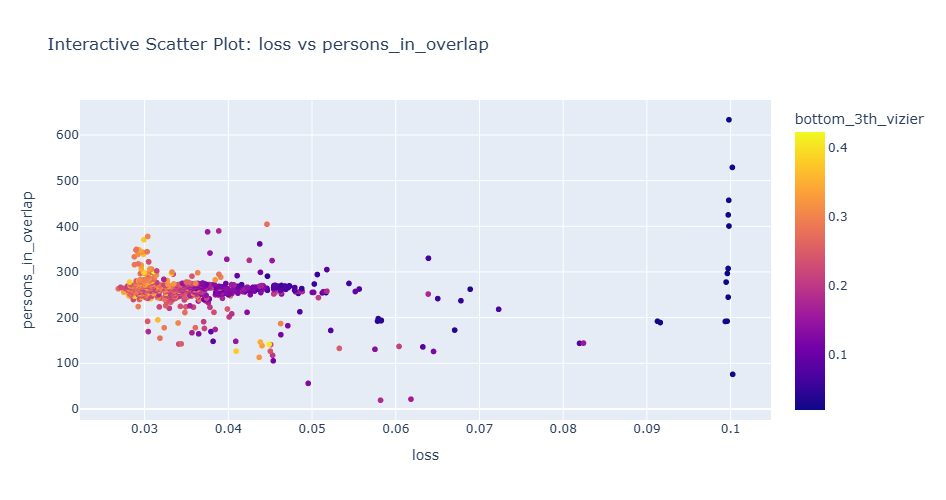

In [74]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='bottom_3th_vizier',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

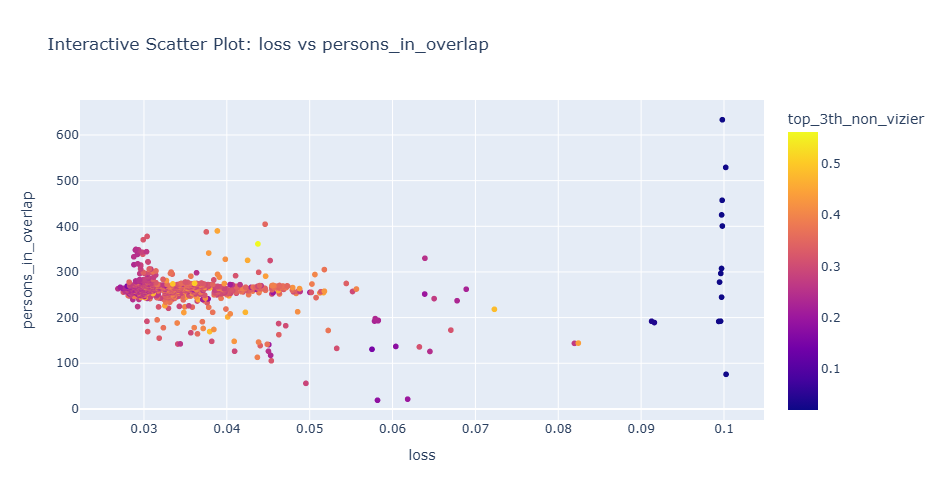

In [75]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='top_3th_non_vizier',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

### others

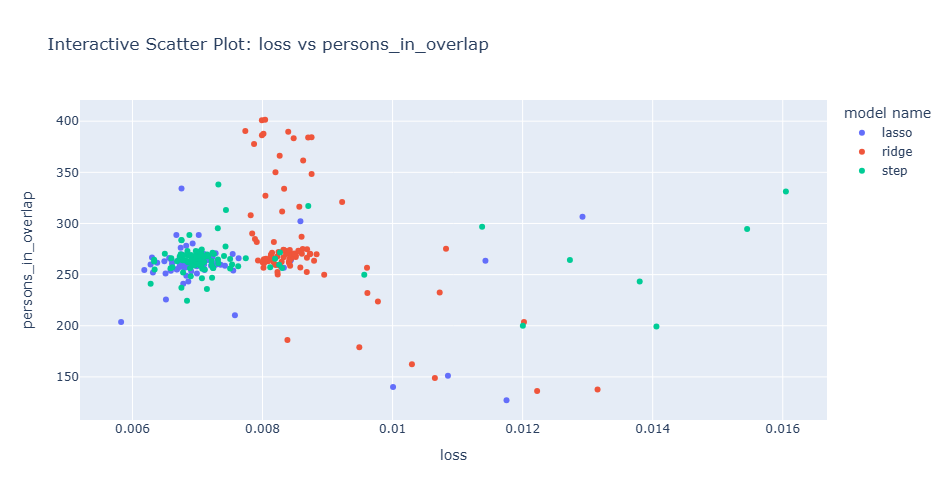

In [76]:
# Create an interactive scatter plot
df = df_original.copy()
mask1 = df['model param'] == 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='model name',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

#### MOD

In [77]:
mod = 'step'

(619, 25)	 shape of df


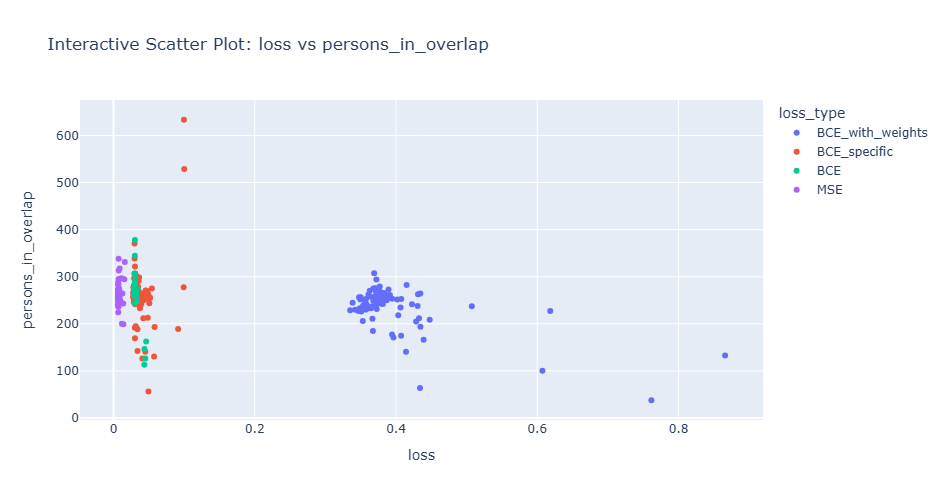

In [78]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] != ''
mask2 = df['model modification'] != ''
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='loss_type',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

print(f'{df.shape}\t shape of df')
# Show the plot
fig.show()

##### STEP optimizers

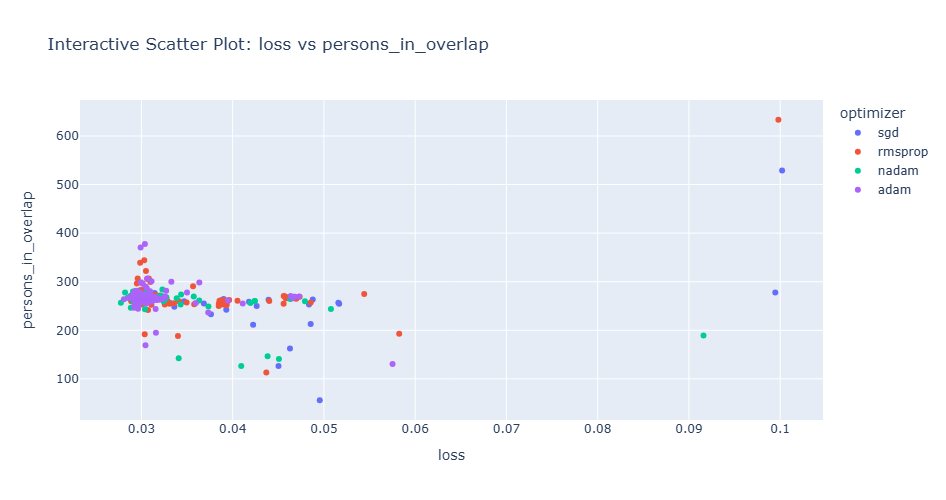

In [79]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='optimizer',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

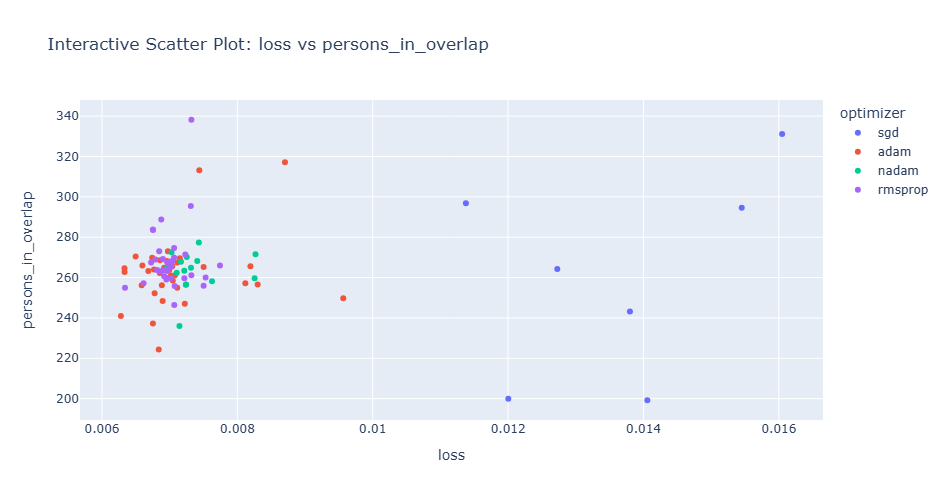

In [80]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] == 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='optimizer',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

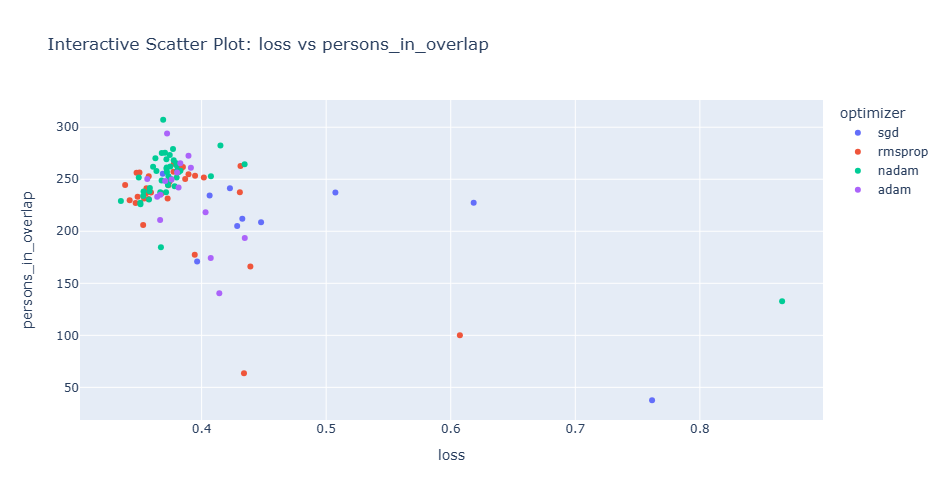

In [81]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] == 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='optimizer',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

##### STEP activations

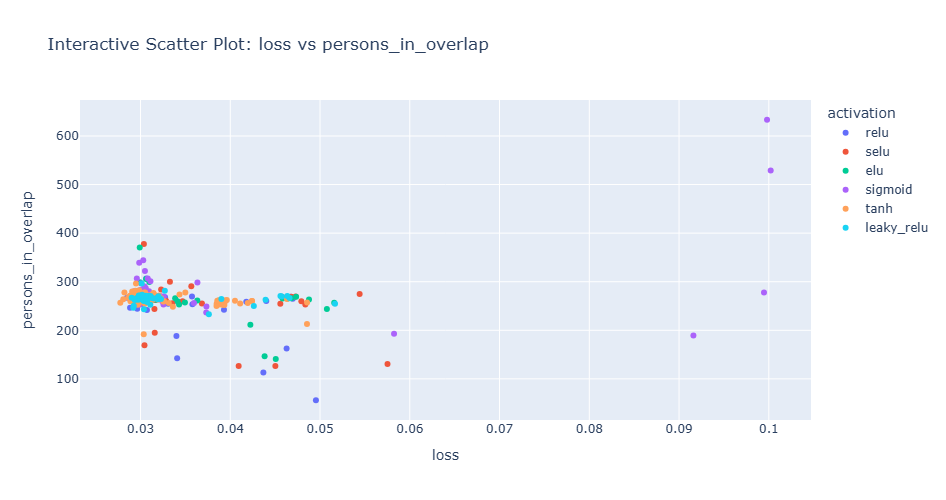

In [83]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='activation',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

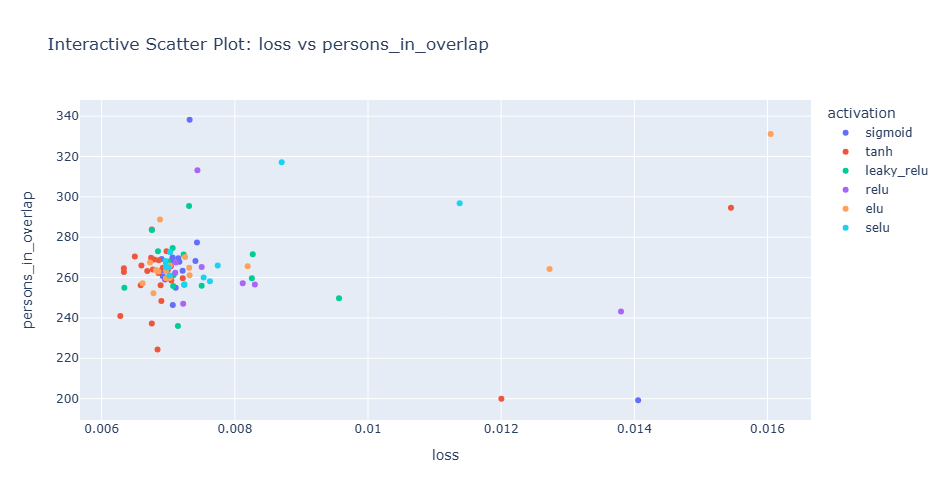

In [84]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] == 'mse'
mask2 = df['model modification'] != 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='activation',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

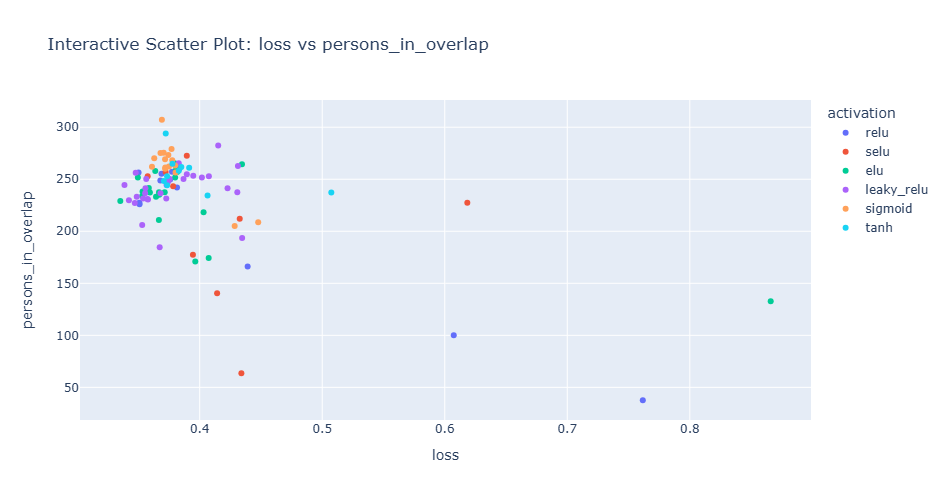

In [86]:
# Create an interactive scatter plot
df = df_original.copy()
mask0 = df['model name'] == mod
mask1 = df['model param'] != 'mse'
mask2 = df['model modification'] == 'weight'
df = df[mask0 & mask1 & mask2]
column_x = 'loss'
column_y = 'persons_in_overlap'

fig = px.scatter(df,
                 x=column_x, y=column_y,
                 color='activation',
                 title=f'Interactive Scatter Plot: {column_x} vs {column_y}',
                 hover_data=df.columns)
# Set custom size (adjust width and height as needed)
fig.update_layout(
    width=800,  # Adjust width (default is ~700)
    height=500   # Adjust height (default is ~450)
)

# Show the plot
fig.show()

#### others

In [60]:
df.columns

Index(['model name', 'model modification', 'model param', 'type', 'trial',
       'time_id', 'n_layers', 'layer_1', 'layer_2', 'layer_3', 'activation',
       'optimizer', 'learning_rate', 'loss', 'epoch', 'mean', 'mean_vizier',
       'mean_non_vizier', 'bottom_3th_vizier', 'top_3th_non_vizier',
       'viziers_above_overlap', 'viziers_in_overlap', 'non_viziers_in_overlap',
       'persons_in_overlap', 'loss_type'],
      dtype='object')